<a href="https://colab.research.google.com/github/mohamed26-cyber/deep-learning/blob/main/DR/Model_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Model Analysis: Understanding Deep Learning Through Visualization

<a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/"><img alt="Creative Commons License" align="left" src="https://i.creativecommons.org/l/by-nc-sa/4.0/80x15.png" /></a>&nbsp;| Dennis Wilson, Jérémy Pirard | <a href="https://supaerodatascience.github.io/deep-learning/">https://supaerodatascience.github.io/deep-learning/</a>

## Introduction

In this notebook, we will explore different methods to **analyze and understand deep learning models**. We will focus on techniques that help us understand what our models have learned and how they make decisions.

We will cover three complementary approaches:

1. **Data Understanding with Dimensionality Reduction**: Using PCA and t-SNE to visualize high-dimensional data and understand data structure
2. **Model Parameter Understanding**: Applying t-SNE to neural network weights to understand learned representations
3. **Model Function Understanding**: Using Gradient-weighted Class Activation Mapping (Grad-CAM) to visualize which parts of an image influence the model's decisions

These techniques are essential for:
- **Debugging models**: Understanding why a model makes certain predictions
- **Building trust**: Explaining model decisions to stakeholders
- **Improving models**: Identifying what features the model focuses on
- **Scientific discovery**: Finding patterns in data that weren't initially obvious

## Installation and Setup

In [1]:
# Install required packages for Colab
!pip install -q xplique torchvision matplotlib scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.4/191.4 kB 8.2 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


## Part 1: Data Understanding Through Dimensionality Reduction

### Theoretical Background

When working with high-dimensional data (like images), it's often difficult to understand the structure and relationships in the data. **Dimensionality reduction** techniques help us project high-dimensional data onto a lower-dimensional space (typically 2D or 3D) that we can visualize.

#### Principal Component Analysis (PCA)

PCA is a **linear** dimensionality reduction technique that finds the directions (principal components) of maximum variance in the data. Mathematically, it performs an eigenvalue decomposition of the data covariance matrix:

$$\mathbf{C} = \frac{1}{n}\mathbf{X}^T\mathbf{X}$$

The principal components are the eigenvectors of this covariance matrix, ordered by their corresponding eigenvalues (which represent the variance explained by each component).

**Key properties:**
- Linear transformation
- Preserves global structure
- Fast to compute
- Assumes linear relationships

#### t-Distributed Stochastic Neighbor Embedding (t-SNE)

t-SNE is a **non-linear** dimensionality reduction technique particularly well-suited for visualization. It works by:

1. Computing pairwise similarities in the high-dimensional space using a Gaussian distribution
2. Defining similar pairwise similarities in the low-dimensional space using a t-distribution
3. Minimizing the Kullback-Leibler divergence between these two distributions

The main idea is to keep similar points close together and dissimilar points far apart in the embedding space.

**Key properties:**
- Non-linear transformation
- Preserves local structure (neighborhood relationships)
- Excellent for visualization
- Computationally more expensive than PCA
- Sensitive to hyperparameters (perplexity, learning rate)

**Important parameters:**
- `perplexity`: Roughly interpreted as the number of close neighbors each point has. Typical values: 5-50
- `n_iter`: Number of optimization iterations. More iterations = better convergence
- `learning_rate`: Step size for gradient descent. Typical values: 10-1000

### Loading and Preprocessing Data

We'll use CIFAR-10, a dataset of 32x32 color images in 10 classes. For computational efficiency, we'll work with a subset of the data.

In [3]:
# CIFAR-10 class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

# Define transforms
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Load CIFAR-10 test set
testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)

# Sample a subset for faster computation (1000 images per class)
n_samples_per_class = 1000
indices = []
for i in range(10):
    class_indices = [idx for idx, (_, label) in enumerate(testset) if label == i]
    indices.extend(class_indices[:n_samples_per_class])

subset = torch.utils.data.Subset(testset, indices)
dataloader = torch.utils.data.DataLoader(subset, batch_size=len(subset), shuffle=False)

# Get all images and labels
images, labels = next(iter(dataloader))
print(f'Dataset shape: {images.shape}')
print(f'Labels shape: {labels.shape}')

100%|██████████| 170M/170M [00:03<00:00, 44.8MB/s]


Dataset shape: torch.Size([10000, 3, 32, 32])
Labels shape: torch.Size([10000])


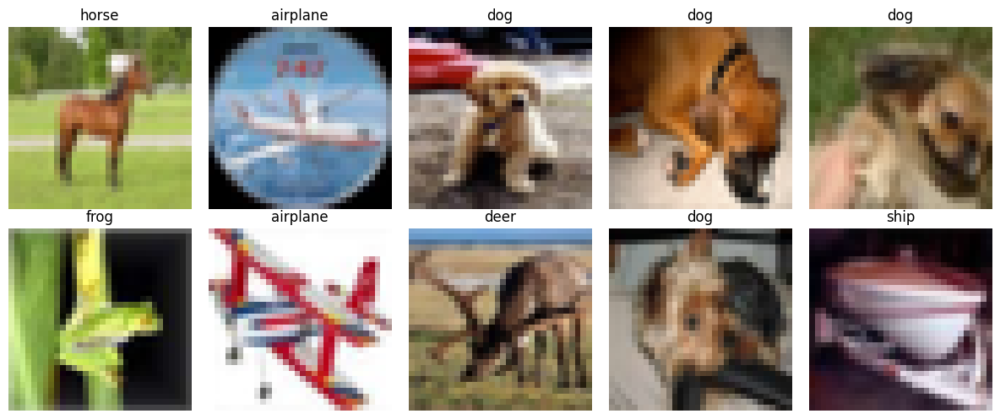

In [4]:
# Visualize some examples
fig, axes = plt.subplots(2, 5, figsize=(12, 5))
for i, ax in enumerate(axes.flat):
    idx = np.random.randint(0, len(images))
    img = images[idx].permute(1, 2, 0).numpy()
    ax.imshow(img)
    ax.set_title(class_names[labels[idx]])
    ax.axis('off')
plt.tight_layout()
plt.show()

### Applying PCA

First, we'll flatten the images and apply PCA to see how well a linear method can separate the different classes.

In [5]:
# Flatten images: (N, C, H, W) -> (N, C*H*W)
X_flat = images.reshape(images.shape[0], -1).numpy()
y = labels.numpy()

print(f'Flattened shape: {X_flat.shape}')
print(f'Original dimensionality: {X_flat.shape[1]}')

Flattened shape: (10000, 3072)
Original dimensionality: 3072


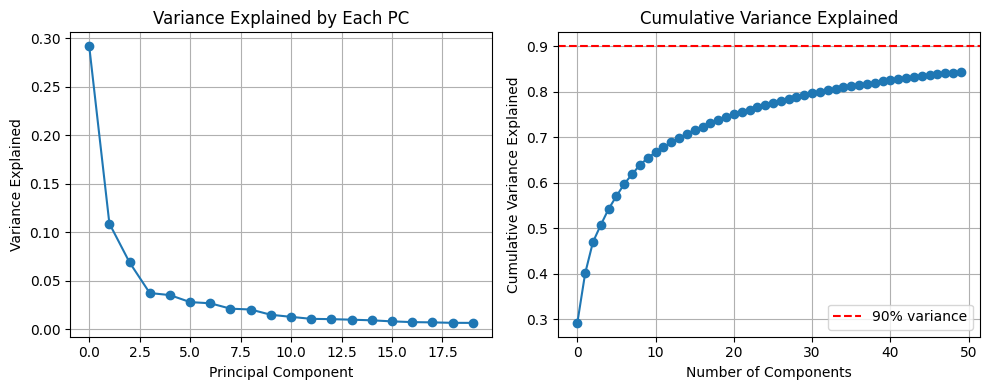

Variance explained by first 2 components: 40.06%
Variance explained by first 50 components: 84.36%


In [6]:
# Apply PCA
pca = PCA(n_components=50)  # Keep 50 components for analysis
X_pca = pca.fit_transform(X_flat)

# Variance explained
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot variance explained
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(pca.explained_variance_ratio_[:20], 'o-')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Variance Explained by Each PC')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(cumulative_variance, 'o-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained')
plt.grid(True)
plt.axhline(y=0.9, color='r', linestyle='--', label='90% variance')
plt.legend()

plt.tight_layout()
plt.show()

print(f'Variance explained by first 2 components: {cumulative_variance[1]:.2%}')
print(f'Variance explained by first 50 components: {cumulative_variance[-1]:.2%}')

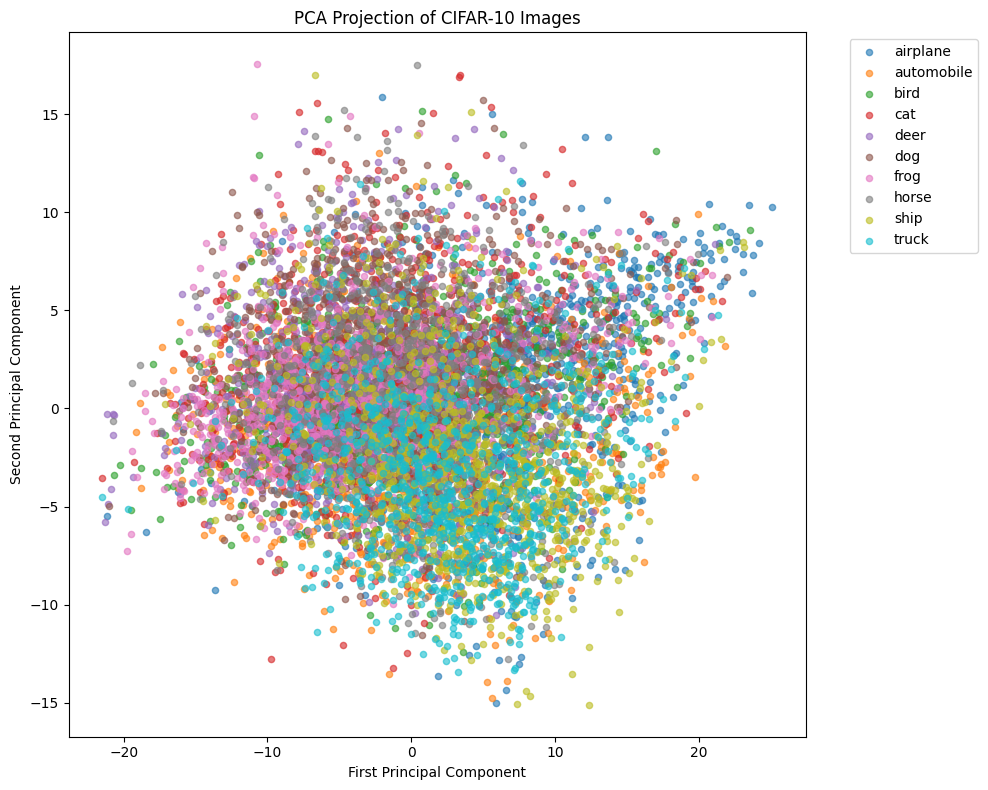

In [7]:
# Visualize PCA projection (first 2 components)
plt.figure(figsize=(10, 8))
for i in range(10):
    mask = y == i
    plt.scatter(X_pca[mask, 0], X_pca[mask, 1],
               label=class_names[i], alpha=0.6, s=20)
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Projection of CIFAR-10 Images')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

**Observation**: PCA, being a linear method, struggles to clearly separate the different classes in CIFAR-10. This is because the differences between classes (e.g., cats vs. dogs) involve complex, non-linear relationships in pixel space.

### Applying t-SNE

Now let's apply t-SNE, which can capture non-linear relationships in the data. For computational efficiency, we'll first reduce the dimensionality with PCA, then apply t-SNE.

In [8]:
# Apply t-SNE on PCA-reduced data for efficiency
tsne = TSNE(n_components=2,
            perplexity=30,
            learning_rate=200,
            n_iter=1000,
            random_state=42,
            verbose=1)

X_tsne = tsne.fit_transform(X_pca)

print(f't-SNE embedding shape: {X_tsne.shape}')

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.002s...
[t-SNE] Computed neighbors for 10000 samples in 1.263s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.630079
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.993996
[t-SNE] KL divergence after 1000 iterations: 2.853724
t-SNE embedding shape: (1

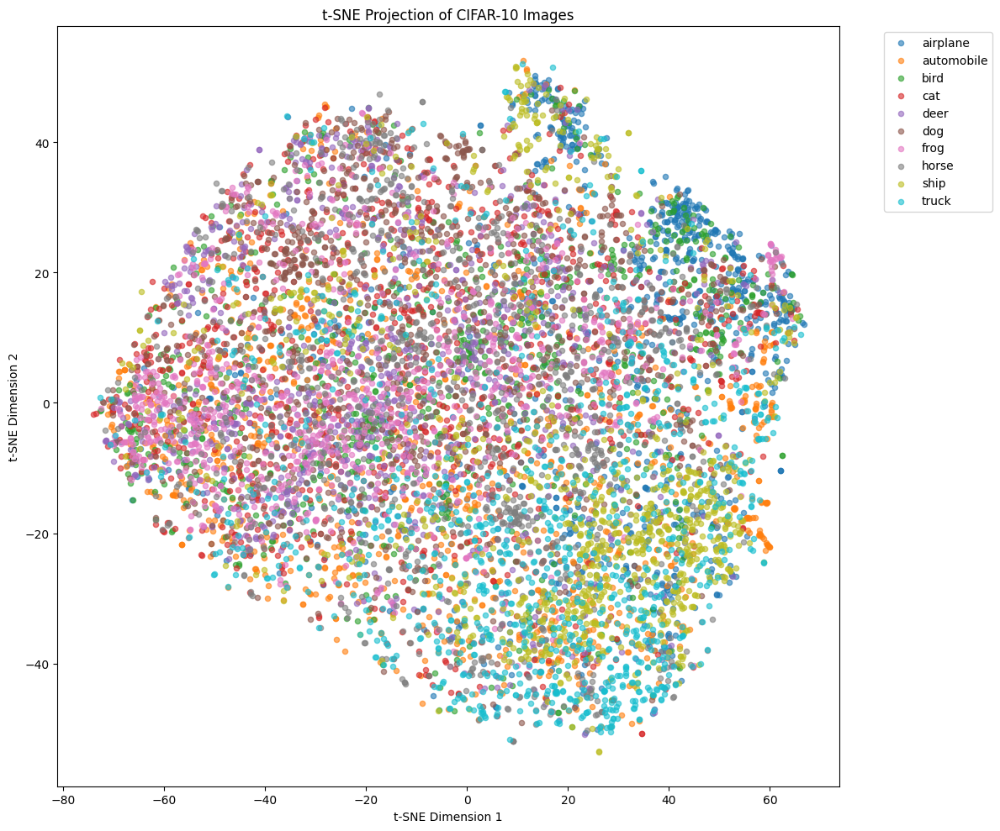

In [9]:
# Visualize t-SNE projection
plt.figure(figsize=(12, 10))
for i in range(10):
    mask = y == i
    plt.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
               label=class_names[i], alpha=0.6, s=20)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Projection of CIFAR-10 Images')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

**Observation**: t-SNE creates much better visual separation between classes compared to PCA. Notice how similar classes (e.g., dog/cat, automobile/truck) are often placed near each other, while dissimilar classes (e.g., airplane/frog) are far apart.

This demonstrates that:
1. The raw pixel space contains non-linear structure
2. Semantic similarity (what humans perceive as "similar") is captured to some extent by this non-linear structure
3. A good feature extractor would need to capture these non-linear relationships

<div class="alert alert-warning">
<b>Exercise 1 (15 minutes): Exploring t-SNE Parameters</b>

The quality of t-SNE visualization depends heavily on its hyperparameters. Your task:

1. Experiment with different values of `perplexity` (try: 5, 30, 50)
2. Try different `learning_rate` values (try: 50, 200, 500)
3. For each combination, create a t-SNE visualization
4. Answer:
   - How does perplexity affect the clustering? (Hint: perplexity relates to the number of neighbors)
   - What happens with a very low or very high learning rate?
   - Which combination gives the clearest class separation?
   - Can you identify which classes are most confusable?

**Bonus**: Try applying t-SNE to only 3 classes (e.g., airplane, automobile, ship) with a smaller perplexity. Does this improve the visualization?
</div>

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.105s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.794674
[t-SNE] KL divergence after 250 iterations with early exaggeration: 106.988998
[t-SNE] KL divergence after 1000 iterations: 3.134234
t-SNE embedding shape: (

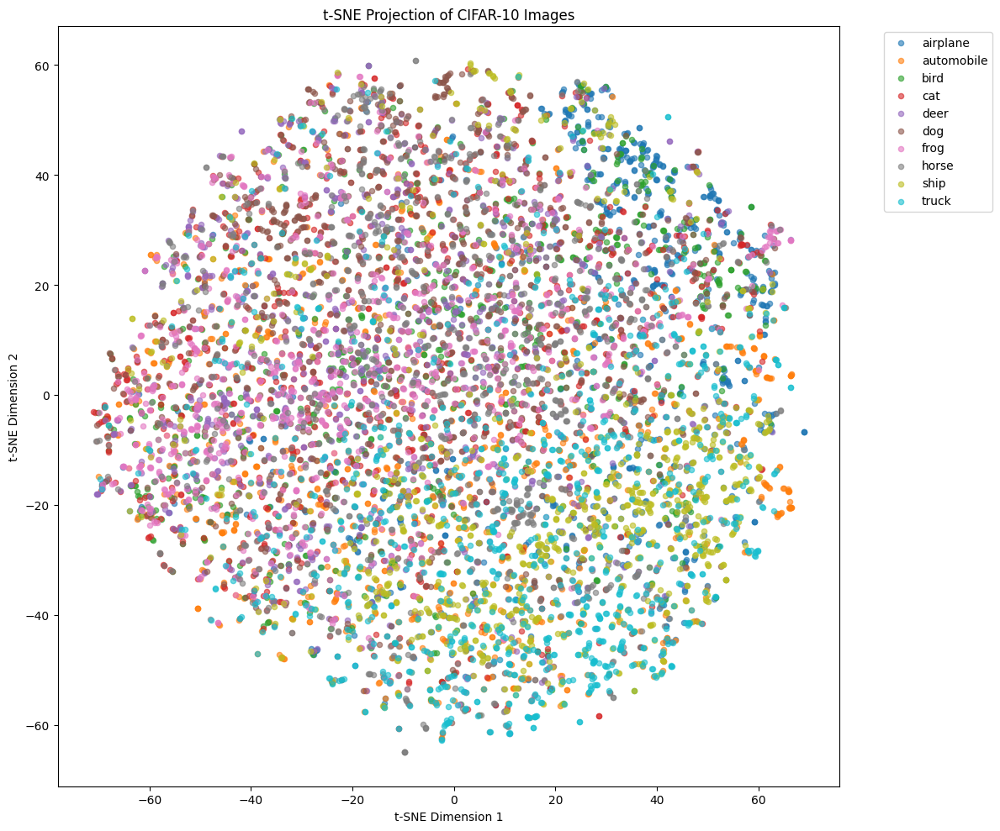

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.072s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.794674
[t-SNE] KL divergence after 250 iterations with early exaggeration: 106.988754
[t-SNE] KL divergence after 1000 iterations: 2.951425
t-SNE embedding shape: (

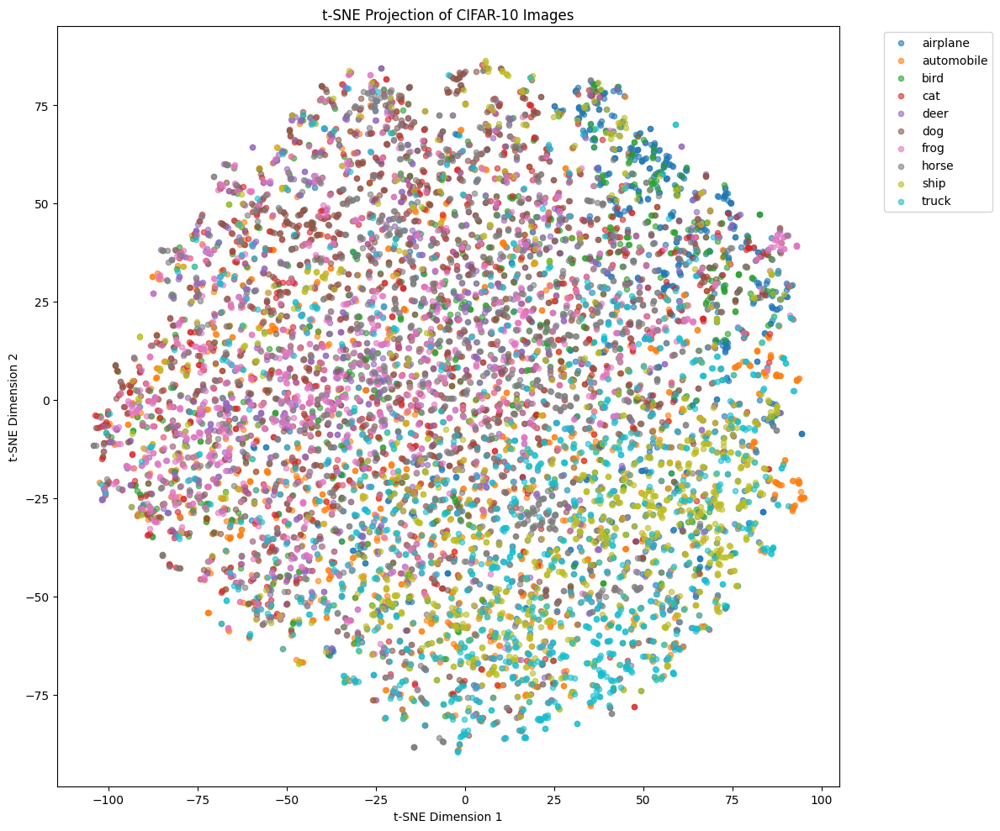

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 0.724s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.794674
[t-SNE] KL divergence after 250 iterations with early exaggeration: 108.046555
[t-SNE] KL divergence after 1000 iterations: 2.932049
t-SNE embedding shape: (

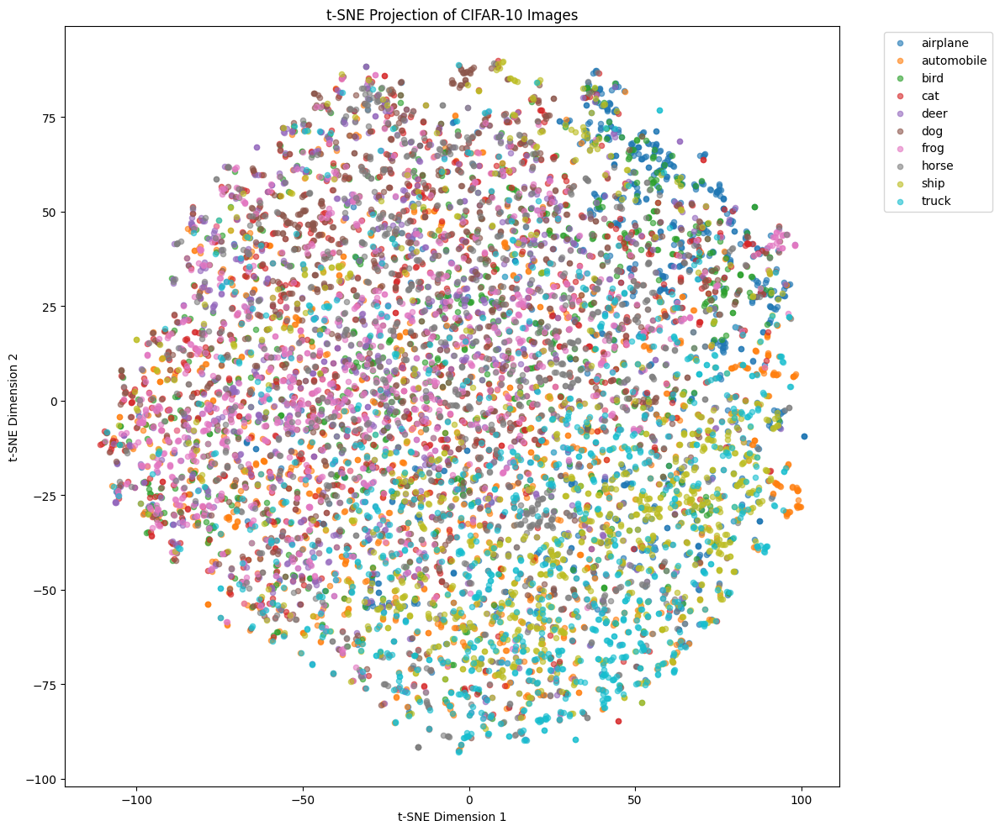

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.484s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.630079
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.997894
[t-SNE] KL divergence after 1000 iterations: 2.920515
t-SNE embedding shape: (1

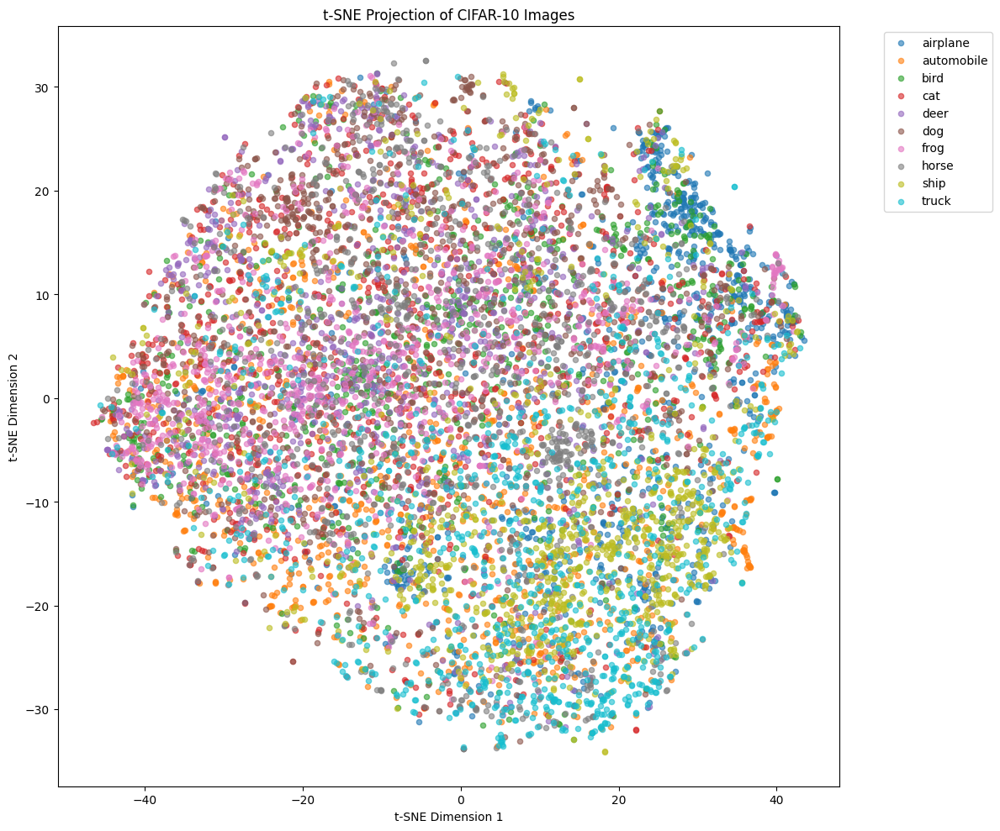

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.002s...
[t-SNE] Computed neighbors for 10000 samples in 0.993s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.630079
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.993996
[t-SNE] KL divergence after 1000 iterations: 2.853724
t-SNE embedding shape: (1

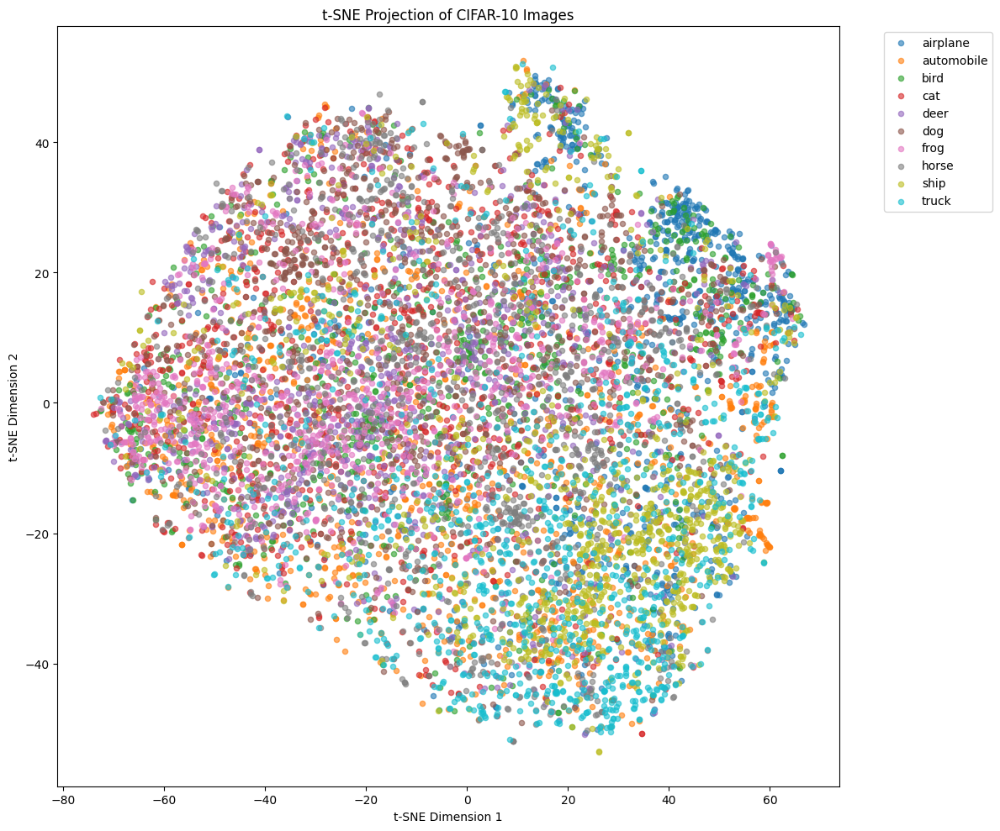

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.002s...
[t-SNE] Computed neighbors for 10000 samples in 1.085s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.630079
[t-SNE] KL divergence after 250 iterations with early exaggeration: 90.695190
[t-SNE] KL divergence after 1000 iterations: 2.893200
t-SNE embedding shape: (1

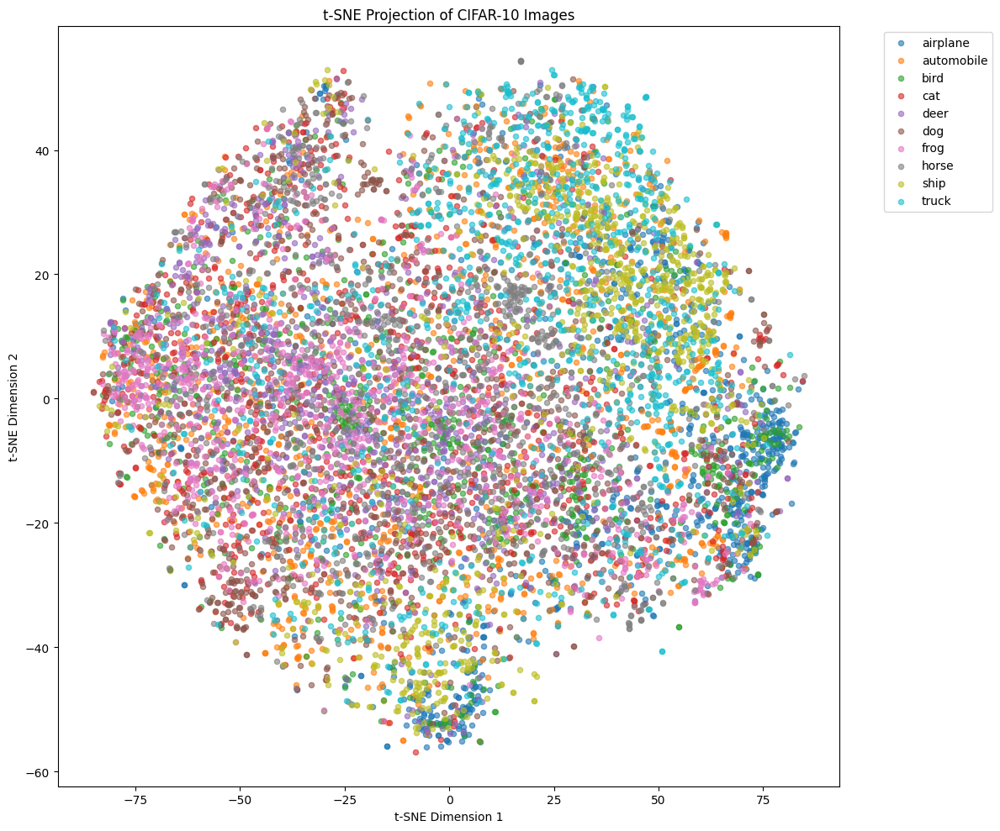

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.259s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.842606
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.411415
[t-SNE] KL divergence after 1000 iterations: 2.710833
t-SNE embedding shape: (

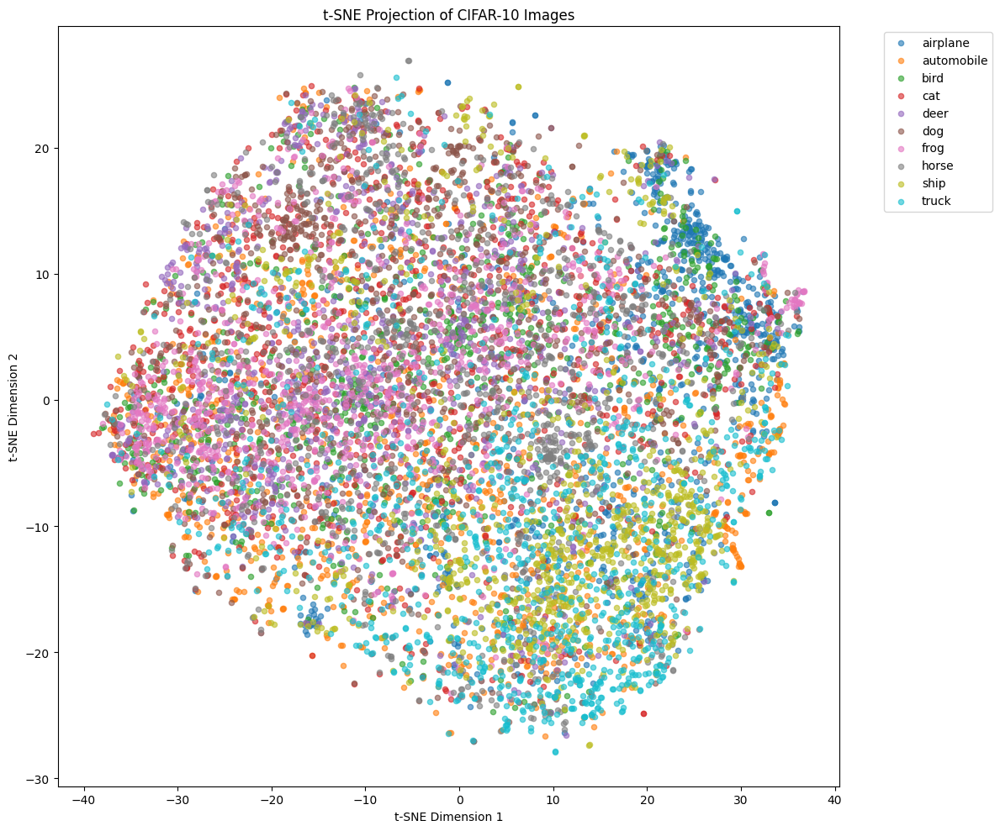

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.272s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.842606
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.408745
[t-SNE] KL divergence after 1000 iterations: 2.666497
t-SNE embedding shape: (

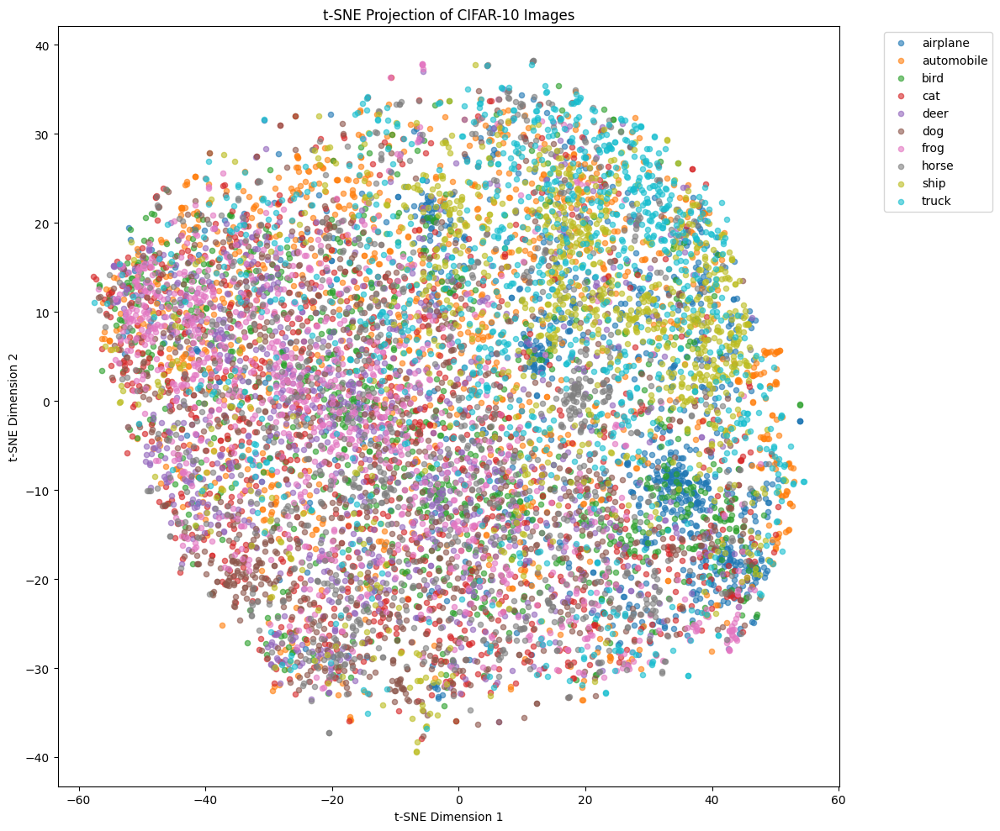

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.494s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.842606
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.927383
[t-SNE] KL divergence after 1000 iterations: 2.720445
t-SNE embedding shape: (

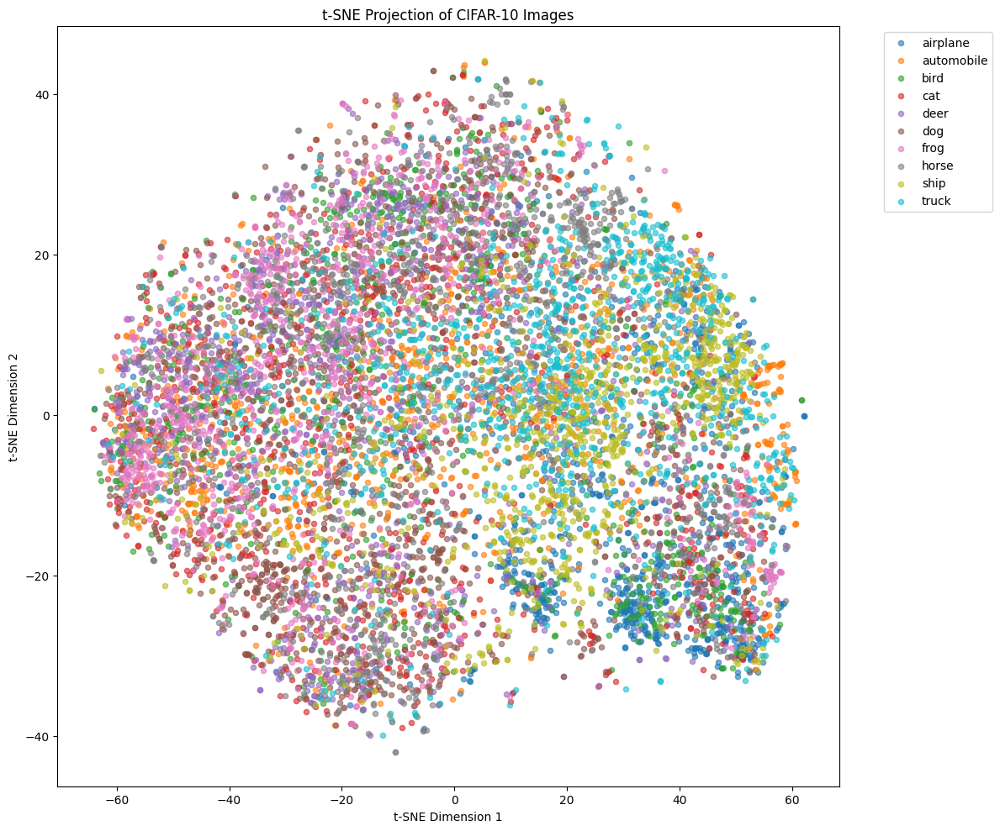

In [11]:
# Your code here for Exercise 1
# Apply t-SNE on PCA-reduced data for efficiency
for perplexity in [5, 30, 50]:
  for learning_rate in [50, 200, 500]:
    tsne = TSNE(n_components=2,
                perplexity=perplexity,
                learning_rate=learning_rate,
                n_iter=1000,
                random_state=42,
                verbose=1)

    X_tsne = tsne.fit_transform(X_pca)

    print(f't-SNE embedding shape: {X_tsne.shape}')

    # Visualize t-SNE projection
    plt.figure(figsize=(12, 10))
    for i in range(10):
        mask = y == i
        plt.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                  label=class_names[i], alpha=0.6, s=20)
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.title('t-SNE Projection of CIFAR-10 Images')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


## Part 2: Understanding Model Parameters with t-SNE

### Theoretical Background

Deep neural networks learn hierarchical representations through their layers. Each neuron in a layer can be characterized by its weight vector, which defines what pattern it responds to. By visualizing these weight vectors using t-SNE, we can understand:

- **Layer specialization**: Do neurons in a layer form distinct groups?
- **Feature diversity**: How diverse are the learned features?
- **Redundancy**: Are there many similar neurons (suggesting redundancy)?

This technique is particularly useful for:
- Understanding what a trained model has learned
- Comparing different training runs or architectures
- Identifying potential issues (e.g., dead neurons, redundant filters)

### Loading a Pretrained Model

We'll use MobileNetV2, a lightweight CNN architecture, pretrained on ImageNet.

In [12]:
# Load pretrained MobileNetV2
model = mobilenet_v2(pretrained=True)
model = model.to(device)
model.eval()

print(model)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 161MB/s]


MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

### Extracting and Visualizing Layer Weights

Let's extract the weights from different layers and visualize them using t-SNE.

In [14]:
def extract_conv_weights(model, layer_name):
    """
    Extract weights from a convolutional layer.
    Returns: weight matrix of shape (out_channels, in_channels * kernel_size^2)
    """
    for name, module in model.named_modules():
        if name == layer_name and isinstance(module, nn.Conv2d):
            weights = module.weight.data.cpu().numpy()
            # Reshape to (out_channels, flattened_filter)
            out_channels = weights.shape[0]
            weights_flat = weights.reshape(out_channels, -1)
            return weights_flat
    raise ValueError(f"Layer {layer_name} not found or is not a Conv2d layer")

# Let's examine the first convolutional layer
# In MobileNetV2, the first layer is at 'features.0.0'
first_layer_weights = extract_conv_weights(model, 'features.0.0')
print(f'First layer weights shape: {first_layer_weights.shape}')
print(f'Number of filters: {first_layer_weights.shape[0]}')
print(f'Filter dimension: {first_layer_weights.shape[1]}')

First layer weights shape: (32, 27)
Number of filters: 32
Filter dimension: 27


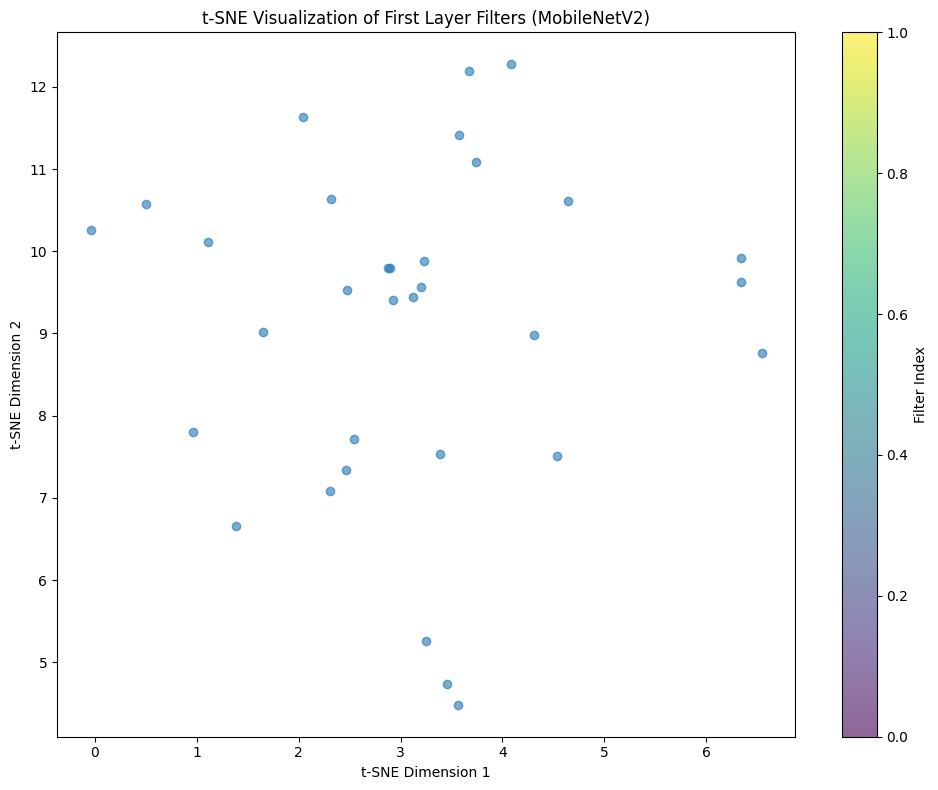

In [15]:
# Apply t-SNE to visualize weight vectors
tsne_weights = TSNE(n_components=2,
                    perplexity=10,  # Smaller perplexity for fewer points
                    random_state=42)
weights_embedded = tsne_weights.fit_transform(first_layer_weights)

# Visualize
plt.figure(figsize=(10, 8))
plt.scatter(weights_embedded[:, 0], weights_embedded[:, 1], alpha=0.6)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Visualization of First Layer Filters (MobileNetV2)')
plt.colorbar(label='Filter Index')
plt.tight_layout()
plt.show()

### Visualizing Filters from Different Layers

Let's compare filters from early and late layers to see how representations change through the network.

features.0.0: 32 filters
features.7.conv.0.0: 192 filters
features.17.conv.0.0: 960 filters


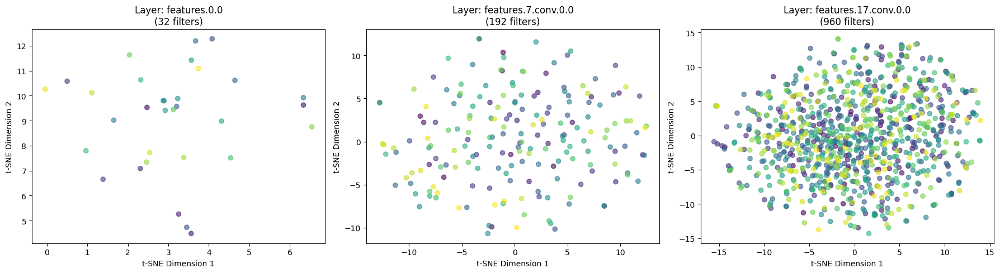

In [16]:
# Extract weights from multiple layers
layer_names = [
    'features.0.0',     # First conv layer
    'features.7.conv.0.0',  # Middle layer
    'features.17.conv.0.0'  # Late layer
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, layer_name in enumerate(layer_names):
    # Extract and embed weights
    weights = extract_conv_weights(model, layer_name)
    print(f'{layer_name}: {weights.shape[0]} filters')

    # Apply PCA first for computational efficiency
    if weights.shape[1] > 50:
        pca_temp = PCA(n_components=50)
        weights = pca_temp.fit_transform(weights)

    tsne_temp = TSNE(n_components=2, perplexity=min(30, weights.shape[0]//3),
                     random_state=42, verbose=0)
    weights_embedded = tsne_temp.fit_transform(weights)

    # Plot
    axes[idx].scatter(weights_embedded[:, 0], weights_embedded[:, 1],
                     c=range(len(weights_embedded)), cmap='viridis', alpha=0.6)
    axes[idx].set_xlabel('t-SNE Dimension 1')
    axes[idx].set_ylabel('t-SNE Dimension 2')
    axes[idx].set_title(f'Layer: {layer_name}\n({weights.shape[0]} filters)')

plt.tight_layout()
plt.show()

**Interpretation**:

- **Early layers** often show more uniform distribution of weights, as they detect basic features (edges, colors)
- **Middle layers** may show clustering, indicating specialized feature detectors
- **Late layers** often show more diverse patterns as they combine features for complex object recognition

The clustering patterns reveal:
- **Tight clusters**: Groups of similar filters (potential redundancy)
- **Spread out points**: Diverse feature detectors
- **Outliers**: Unusual or specialized filters

<div class="alert alert-warning">
<b>Exercise 2 (15 minutes): Comparing Trained vs. Random Networks</b>

To understand what training does to network weights, compare the weight distributions of:
1. A pretrained MobileNetV2 (already loaded)
2. A randomly initialized MobileNetV2

Your task:
1. Create a new randomly initialized MobileNetV2: `random_model = mobilenet_v2(pretrained=False)`
2. Extract weights from the same layer (e.g., 'features.7.conv.0.0') from both models
3. Create t-SNE visualizations for both
4. Compare:
   - Do trained weights show more structure/clustering?
   - Are random weights more uniformly distributed?
   - What does this tell us about what training achieves?

**Bonus**: Compute the pairwise distance matrix between filters in both models. Are trained filters more spread out (diverse) or more clustered?
</div>

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


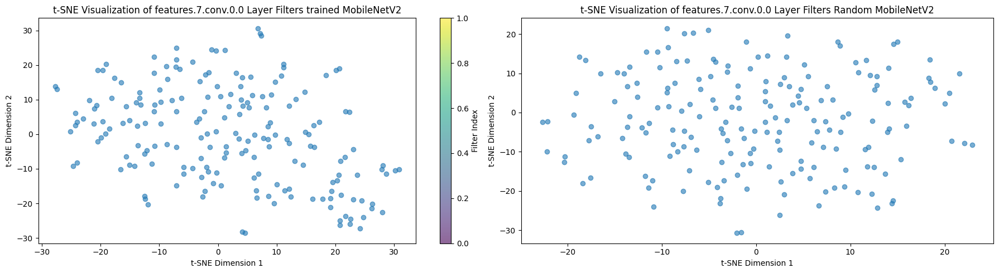

In [28]:
# Your code here for Exercise 2
#Create a new randomly initialized MobileNetV2
random_model= mobilenet_v2(pretrained=False)
random_model = random_model.to(device)
random_model.eval()
hidden_layer_weights_model = extract_conv_weights(model, 'features.7.conv.0.0')
hidden_layer_weights_random = extract_conv_weights(random_model, 'features.7.conv.0.0')
# Apply t-SNE to visualize weight vectors
tsne_weights = TSNE(n_components=2,
                    perplexity=10,  # Smaller perplexity for fewer points
                    random_state=42)
weights_embedded_model = tsne_weights.fit_transform(hidden_layer_weights_model)
weights_embedded_random = tsne_weights.fit_transform(hidden_layer_weights_random)

fig, axes = plt.subplots(1, 2, figsize=(18, 5))
plt.subplot(1, 2, 1)
plt.scatter(weights_embedded_model[:, 0], weights_embedded_model[:, 1], alpha=0.6)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Visualization of features.7.conv.0.0 Layer Filters trained MobileNetV2')
plt.colorbar(label='Filter Index')
plt.tight_layout()
plt.subplot(1, 2, 2)
plt.scatter(weights_embedded_random[:, 0], weights_embedded_random[:, 1], alpha=0.6)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Visualization of features.7.conv.0.0 Layer Filters Random MobileNetV2')
plt.tight_layout()
plt.show()



## Part 3: Understanding Model Decisions with Grad-CAM

### Theoretical Background

**Gradient-weighted Class Activation Mapping (Grad-CAM)** is a powerful technique for understanding which regions of an input image are important for a neural network's predictions. Unlike the previous dimensionality reduction techniques which are exploratory, Grad-CAM provides **explanations** for specific predictions.

#### How Grad-CAM Works

For a target class $c$ and a convolutional layer with feature maps $A^k$, Grad-CAM computes:

1. **Gradients**: Compute gradients of the class score $y^c$ with respect to feature maps:
   $$\frac{\partial y^c}{\partial A^k}$$

2. **Importance weights**: Global average pooling of gradients gives importance of each feature map:
   $$\alpha_k^c = \frac{1}{Z} \sum_i \sum_j \frac{\partial y^c}{\partial A_{ij}^k}$$

3. **Weighted combination**: Compute weighted combination of feature maps with ReLU:
   $$L_{Grad-CAM}^c = ReLU\left(\sum_k \alpha_k^c A^k\right)$$

The ReLU ensures we only consider features that positively influence the class score.

#### Why Grad-CAM is Useful

- **Visual explanations**: Highlights which parts of the image influenced the decision
- **Debugging**: Identify if the model is focusing on the right features
- **Bias detection**: Reveal spurious correlations (e.g., model using background instead of object)
- **Trust**: Build confidence in model predictions by showing reasoning
- **Model comparison**: Compare what different models focus on

**Important**: Grad-CAM highlights **where** the model looks, not **what** it sees. The visualization shows spatial regions important for a class, but doesn't tell us what features in those regions are important.

### Setting Up Grad-CAM with PyTorch

We'll use the `pytorch-grad-cam` library which provides a clean implementation.

In [17]:
# Install pytorch-grad-cam
!pip install -q grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 74.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [18]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Prepare model for Grad-CAM
model = mobilenet_v2(pretrained=True)
model = model.to(device)
model.eval()

# For MobileNetV2, we typically use the last convolutional layer
target_layers = [model.features[-1]]

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### Preparing ImageNet Images

We'll download a few example images and see what the model focuses on.

In [19]:
from PIL import Image
import requests
from io import BytesIO

# ImageNet preprocessing
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225]),
])

# Load ImageNet class names
!wget -q https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
with open('imagenet_classes.txt', 'r') as f:
    imagenet_classes = [line.strip() for line in f.readlines()]

print(f'Loaded {len(imagenet_classes)} ImageNet classes')

Loaded 1000 ImageNet classes


2025-12-09 08:37:29 URL:https://images.unsplash.com/photo-1615602127413-459bdb48cf45?ixlib=rb-4.1.0&q=85&fm=jpg&crop=entropy&cs=srgb&dl=phil-plante-X2PwqTUpXH8-unsplash.jpg&w=640 [78042/78042] -> "fox1.jpg" [1]
2025-12-09 08:37:29 URL:https://images.unsplash.com/photo-1516934024742-b461fba47600?ixlib=rb-4.1.0&q=85&fm=jpg&crop=entropy&cs=srgb&dl=sunguk-kim-tIfrzHxhPYQ-unsplash.jpg&w=640 [99332/99332] -> "fox2.jpg" [1]
2025-12-09 08:37:30 URL:https://images.unsplash.com/photo-1496196614460-48988a57fccf?ixlib=rb-4.1.0&q=85&fm=jpg&crop=entropy&cs=srgb&dl=randall-ruiz-LVnJlyfa7Zk-unsplash.jpg&w=640 [102191/102191] -> "sea_turtle.jpg" [1]
2025-12-09 08:37:30 URL:https://images.unsplash.com/photo-1552833172-fd5ac167c18c?ixlib=rb-4.1.0&q=85&fm=jpg&crop=entropy&cs=srgb&dl=zdenek-machacek-sSEEbAzB6fU-unsplash.jpg&w=640 [110648/110648] -> "lynx.jpg" [1]
2025-12-09 08:37:31 URL:https://images.unsplash.com/photo-1616588945355-bb09c77baf29?ixlib=rb-4.1.0&q=85&fm=jpg&crop=entropy&cs=srgb&dl=sandra-41

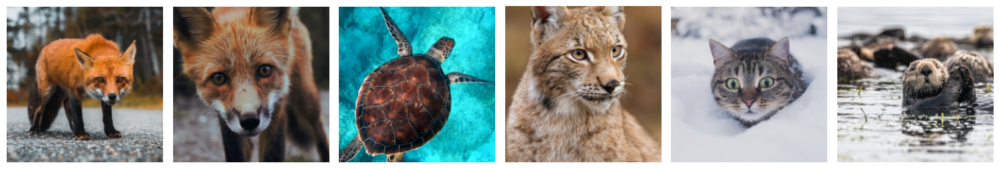

In [20]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# downloading image from unsplash...
!wget -nv 'https://unsplash.com/photos/X2PwqTUpXH8/download?force=true&w=640' -O 'fox1.jpg'
!wget -nv 'https://unsplash.com/photos/tIfrzHxhPYQ/download?force=true&w=640' -O 'fox2.jpg'
!wget -nv 'https://unsplash.com/photos/LVnJlyfa7Zk/download?force=true&w=640' -O 'sea_turtle.jpg'
!wget -nv 'https://unsplash.com/photos/sSEEbAzB6fU/download?force=true&w=640' -O 'lynx.jpg'
!wget -nv 'https://unsplash.com/photos/41dAczoRYJY/download?force=true&w=640' -O 'cat.jpg'
!wget -nv 'https://unsplash.com/photos/axqTLZ12Jss/download?force=true&w=640' -O 'otter.jpg'

# List of (filepath, ImageNet_label)
image_filepath_labels = [
    ('fox1.jpg', 277), # ImageNet class for 'red fox'
    ('fox2.jpg', 277), # ImageNet class for 'red fox'
    ('sea_turtle.jpg', 33), # ImageNet class for 'sea turtle'
    ('lynx.jpg', 287), # ImageNet class for 'lynx'
    ('cat.jpg', 281), # ImageNet class for 'tabby cat'
    ('otter.jpg', 360) # ImageNet class for 'otter'
]

# Define transforms for displaying images
transform_for_display = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
])

# Lists to store PIL images and their corresponding labels for use with Grad-CAM
gradcam_input_pil_images = []
gradcam_input_labels = []

# Lists to store processed images (numpy arrays) for matplotlib display
images_for_matplotlib_display = []

for img_filepath, label in image_filepath_labels:
    # Load image using PIL
    img_pil = Image.open(img_filepath).convert('RGB')

    # Store the PIL image and label for Grad-CAM
    gradcam_input_pil_images.append(img_pil)
    gradcam_input_labels.append(label)

    # Apply the display transform for matplotlib visualization
    img_processed_for_display = transform_for_display(img_pil)
    images_for_matplotlib_display.append(np.array(img_processed_for_display)) # Convert to numpy array for matplotlib

plt.rcParams["figure.figsize"] = [15, 6]
for img_id, img_array in enumerate(images_for_matplotlib_display):
  plt.subplot(1, len(images_for_matplotlib_display), img_id+1)
  plt.imshow(img_array / 255.0) # Matplotlib expects floats in [0,1] or ints in [0,255]
  plt.axis('off')
plt.tight_layout()
plt.show()

# Now, gradcam_input_pil_images contains PIL Image objects
# and gradcam_input_labels contains the corresponding integer labels,
# ready for use with apply_gradcam.


### Applying Grad-CAM

In [21]:
def apply_gradcam(image, model, target_layers, target_class=None):
    """
    Apply Grad-CAM to an image.

    Args:
        image: PIL Image
        model: PyTorch model
        target_layers: List of layers to compute Grad-CAM on
        target_class: Target class index (if None, uses predicted class)

    Returns:
        cam: Grad-CAM heatmap
        predicted_class: Predicted class index
        predicted_name: Predicted class name
    """
    # Preprocess image
    input_tensor = preprocess(image).unsqueeze(0).to(device)

    # Get prediction
    with torch.no_grad():
        output = model(input_tensor)
        predicted_class = output.argmax(dim=1).item()

    # Use predicted class if target not specified
    if target_class is None:
        target_class = predicted_class
    print("Running GradCAM on class ", target_class)
    # Create Grad-CAM object
    cam = GradCAM(model=model, target_layers=target_layers)

    # Compute Grad-CAM
    targets = [ClassifierOutputTarget(target_class)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]

    return grayscale_cam, target_class, imagenet_classes[target_class]

def visualize_gradcam(image, cam, predicted_class, title=""):
    """
    Visualize Grad-CAM on an image.
    """
    # Resize image to 224x224 to match CAM
    img_resized = image.resize((224, 224))
    img_array = np.array(img_resized) / 255.0

    # Create visualization
    visualization = show_cam_on_image(img_array, cam, use_rgb=True)

    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(img_resized)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(cam, cmap='jet')
    axes[1].set_title('Grad-CAM Heatmap')
    axes[1].axis('off')

    axes[2].imshow(visualization)
    axes[2].set_title(f'Grad-CAM Overlay\nPredicted: {predicted_class}')
    axes[2].axis('off')

    if title:
        fig.suptitle(title, fontsize=14)

    plt.tight_layout()
    plt.show()

Running GradCAM on class  277


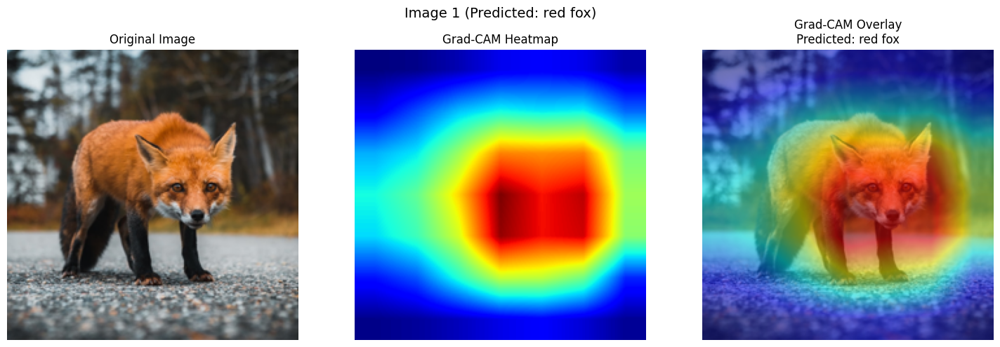

Running GradCAM on class  277


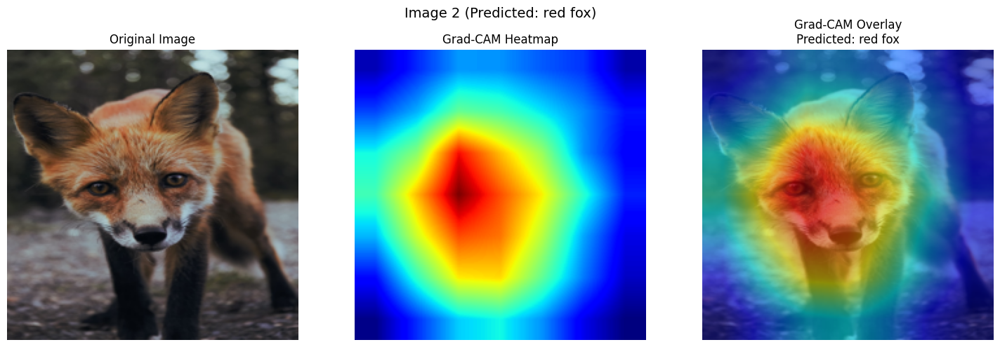

Running GradCAM on class  33


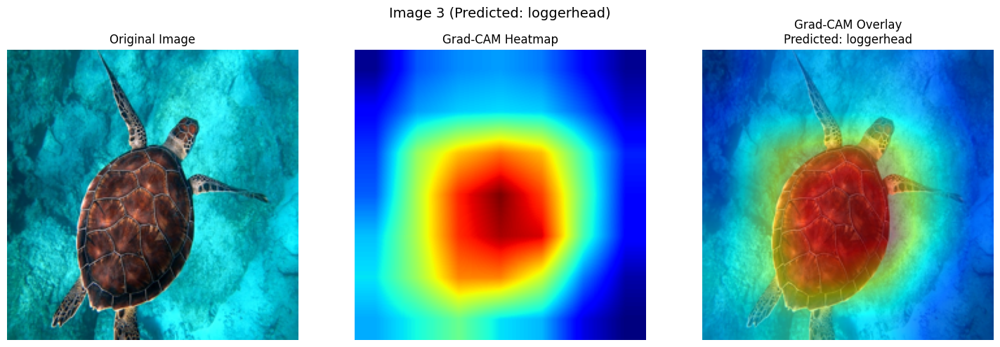

Running GradCAM on class  287


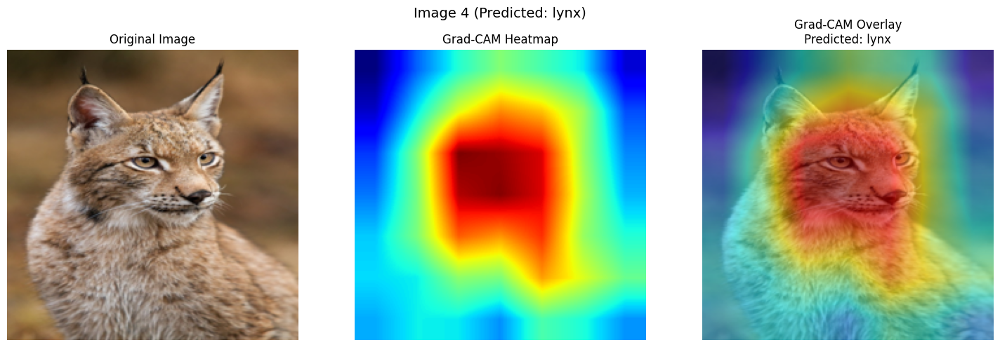

Running GradCAM on class  281


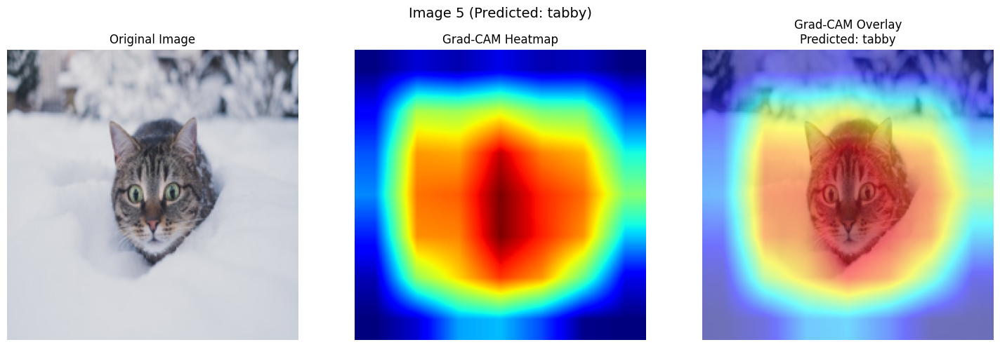

Running GradCAM on class  360


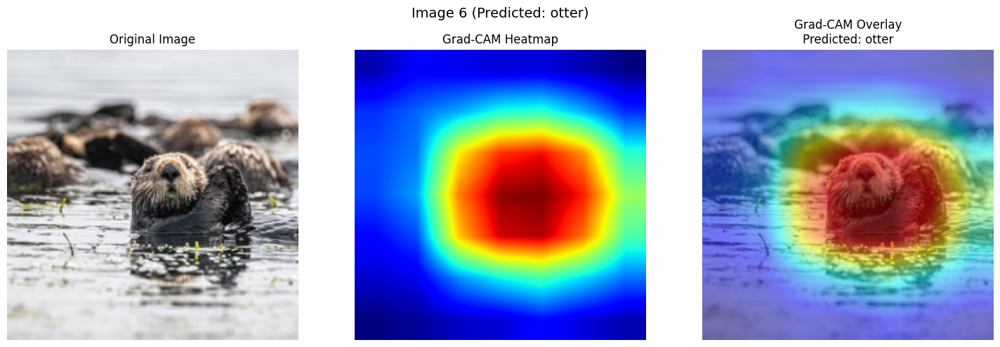

In [22]:
# Apply Grad-CAM to our example images
# Use the PIL images and labels prepared in the previous cell (CEzLCSTkUh_a)
for idx, img_pil in enumerate(gradcam_input_pil_images):
    # By default, apply_gradcam will use the model's predicted class if target_class is None.
    # This is suitable for general visualization of model focus.
    cam, pred_class, pred_name = apply_gradcam(img_pil, model, target_layers)
    visualize_gradcam(img_pil, cam, pred_name,
                     title=f"Image {idx+1} (Predicted: {pred_name})")

**Interpretation**:

The Grad-CAM visualization shows:
- **Red regions**: Areas that strongly activate the predicted class
- **Blue regions**: Areas with minimal influence

Key observations:
1. The model typically focuses on the object of interest (e.g., the cat's face)
2. Sometimes the model uses context (e.g., background) for classification
3. Different parts of an object may be more important than others

### Comparing Different Target Classes

We can use Grad-CAM to understand what the model focuses on for different class predictions.

In [23]:
# Let's take one image and see what the model focuses on for different classes
test_image = gradcam_input_pil_images[4]

# Get top-5 predictions
input_tensor = preprocess(test_image).unsqueeze(0).to(device)
with torch.no_grad():
    output = model(input_tensor)
    probs = torch.nn.functional.softmax(output[0], dim=0)
    top5_prob, top5_idx = torch.topk(probs, 5)
    bottom5_prob, bottom5_idx = torch.topk(probs, 5, largest=False)

print("Top 5 predictions:")
for prob, idx in zip(top5_prob, top5_idx):
    print(f"{imagenet_classes[idx]}: {prob.item():.3f}")

print("Bottom 5 predictions:")
for prob, idx in zip(bottom5_prob, bottom5_idx):
    print(f"{imagenet_classes[idx]}: {prob.item():.3f}")

Top 5 predictions:
tabby: 0.669
Egyptian cat: 0.154
tiger cat: 0.131
carton: 0.005
bow tie: 0.004
Bottom 5 predictions:
colobus: 0.000
yurt: 0.000
gibbon: 0.000
stinkhorn: 0.000
Arabian camel: 0.000


Running GradCAM on class  281
Running GradCAM on class  285
Running GradCAM on class  282


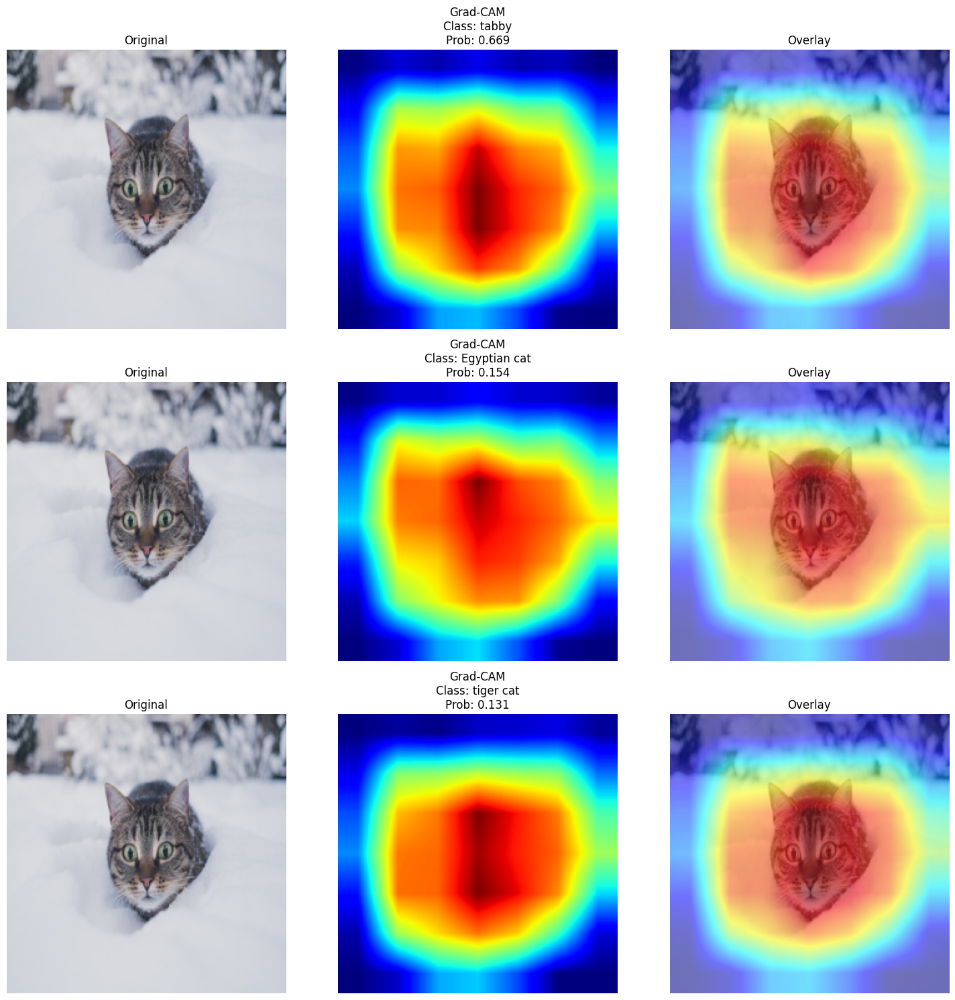

In [24]:
# Generate Grad-CAM for each of the top-3 classes
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

img_resized = test_image.resize((224, 224))
img_array = np.array(img_resized) / 255.0

for row, idx in enumerate(top5_idx[:3]):
    cam, _, class_name = apply_gradcam(test_image, model, target_layers,
                                       target_class=idx.item())
    visualization = show_cam_on_image(img_array, cam, use_rgb=True)

    axes[row, 0].imshow(img_resized)
    axes[row, 0].set_title('Original')
    axes[row, 0].axis('off')

    axes[row, 1].imshow(cam, cmap='jet')
    axes[row, 1].set_title(f'Grad-CAM\nClass: {class_name}\nProb: {top5_prob[row]:.3f}')
    axes[row, 1].axis('off')

    axes[row, 2].imshow(visualization)
    axes[row, 2].set_title('Overlay')
    axes[row, 2].axis('off')

plt.tight_layout()
plt.show()

**Observation**: Different classes may focus on different regions of the same image, however we see that the Grad-CAM analysis for these similar classes is almost identical. When we observe Grad-CAM analysis on very unlikely classes, we can see that the participating activations are rather random.

Running GradCAM on class  375
Running GradCAM on class  915
Running GradCAM on class  368


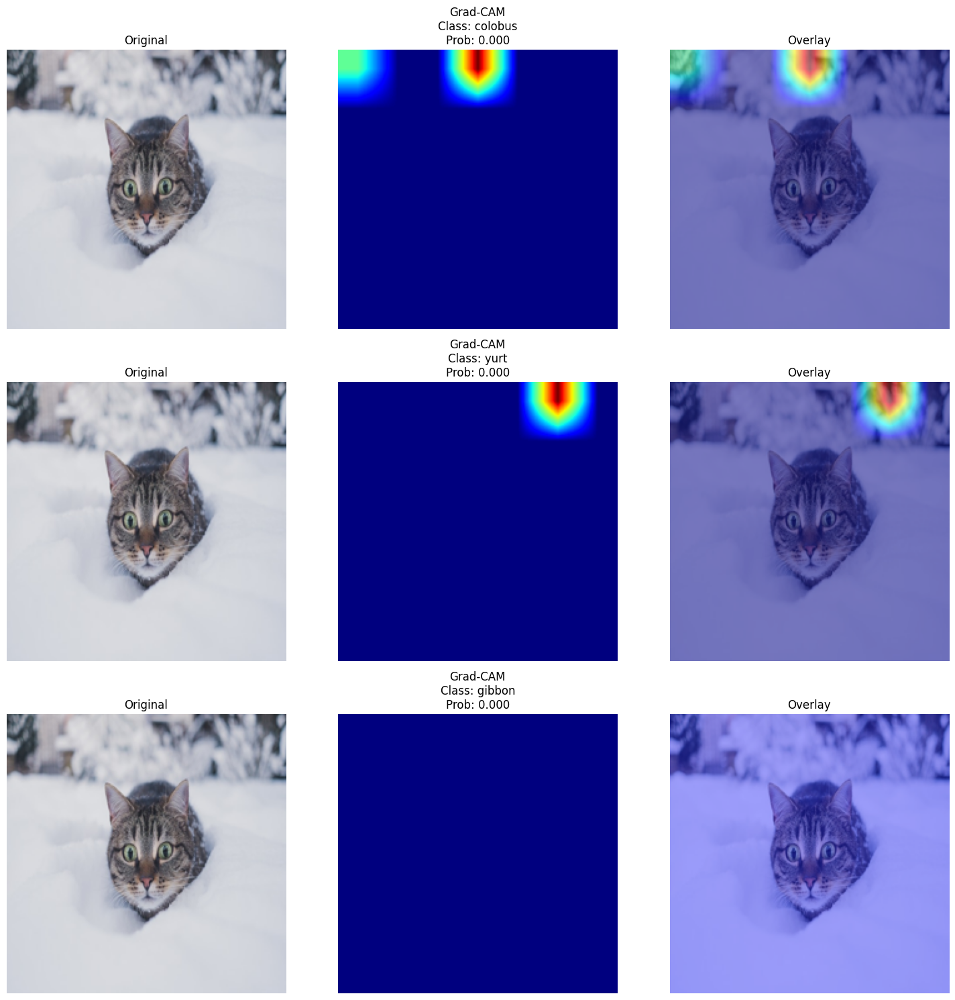

In [25]:
# Generate Grad-CAM for 3 random classes
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

img_resized = test_image.resize((224, 224))
img_array = np.array(img_resized) / 255.0

for row, idx in enumerate(bottom5_idx[:3]):
    cam, _, class_name = apply_gradcam(test_image, model, target_layers,
                                       target_class=idx.item())
    visualization = show_cam_on_image(img_array, cam, use_rgb=True)

    axes[row, 0].imshow(img_resized)
    axes[row, 0].set_title('Original')
    axes[row, 0].axis('off')

    axes[row, 1].imshow(cam, cmap='jet')
    axes[row, 1].set_title(f'Grad-CAM\nClass: {class_name}\nProb: {bottom5_prob[row]:.3f}')
    axes[row, 1].axis('off')

    axes[row, 2].imshow(visualization)
    axes[row, 2].set_title('Overlay')
    axes[row, 2].axis('off')

plt.tight_layout()
plt.show()

<div class="alert alert-warning">
<b>Exercise 3 (15 minutes): Debugging Model Errors with Grad-CAM</b>

Grad-CAM is particularly useful for understanding why a model makes mistakes. Your task:

1. Find an image where the model makes a **wrong prediction** (hint: try images with multiple objects)
2. Apply Grad-CAM to:
   - The predicted (wrong) class
   - The true (correct) class
3. Compare the two visualizations and answer:
   - Where does the model focus for the wrong prediction?
   - Where should it focus (for the correct class)?
   - What does this tell you about why the model made a mistake?
   - Is it focusing on a misleading feature (e.g., background, texture)?

**Example scenarios to try**:
- An image with multiple objects (which one does the model focus on?)
- An image with unusual lighting or angles
- An image where the object is partially occluded

**Bonus**: Try applying Grad-CAM to different layers (early, middle, late) using different elements from `target_layers`. How do the visualizations differ?
</div>

In [ ]:
# Your code here for Exercise 3



## Bonus Section: Sparse Autoencoders for LLM Interpretability

### Motivation

Large Language Models (LLMs) like GPT process text through high-dimensional activations (e.g., 4096 dimensions). Understanding what these activations represent is crucial for:
- **Safety**: Detecting when models encode harmful information
- **Reliability**: Understanding failure modes
- **Control**: Steering model behavior

### The Challenge: Superposition

Neural networks, especially in LLMs, exhibit a phenomenon called **superposition**: they encode more features than they have dimensions. For example:
- A 4096-dimensional layer might encode 10,000+ distinct concepts
- Features are represented as **sparse combinations** of neurons
- Individual neurons are **polysemantic** (respond to multiple unrelated concepts)

This makes interpretation difficult: looking at individual neurons doesn't reveal clear features.

### Sparse Autoencoders (SAEs)

**Sparse Autoencoders** aim to "disentangle" these superposed features:

$$\begin{align}
\text{Encoder: } & \mathbf{z} = \text{ReLU}(W_e \mathbf{x} + b_e) \\
\text{Decoder: } & \hat{\mathbf{x}} = W_d \mathbf{z} + b_d
\end{align}$$

With loss:
$$\mathcal{L} = \|\mathbf{x} - \hat{\mathbf{x}}\|_2^2 + \lambda \|\mathbf{z}\|_1$$

**Key innovations**:
1. **Overcomplete**: $z$ has more dimensions than $x$ (e.g., 16×)
2. **Sparsity penalty**: $L_1$ term encourages most $z_i$ to be zero
3. **Result**: Each dimension of $z$ learns to represent a **monosemantic feature**

### What Can We Learn?

By training SAEs on LLM activations, researchers have discovered:
- **Concept neurons**: Single SAE features that activate for specific concepts (e.g., "code", "DNA", "legal text")
- **Feature families**: Groups of related features (e.g., different programming languages)
- **Compositional structure**: How complex concepts are built from simpler ones
- **Safety-relevant features**: Neurons that activate for harmful content

### Example: Understanding a Feature

For a given SAE feature $z_i$:
1. **Activation pattern**: When does $z_i > 0$? (collect examples)
2. **Max activating examples**: What inputs cause largest $z_i$?
3. **Interpretability**: Can we describe $z_i$ in human terms?

### Recent Work

- **Anthropic (2024)**: Trained SAEs on Claude models, found interpretable features at multiple scales
- **DeepMind (2024)**: Used SAEs to understand Gemini's reasoning process
- **OpenAI (2024)**: Demonstrated SAE-based steering of GPT-4

### Key Insight

The success of SAEs suggests that:
1. Neural networks do learn interpretable features
2. These features are **sparse** (most are inactive for any given input)
3. The features exist in **superposition** in the original network
4. With the right technique (SAEs), we can recover them

This is a powerful paradigm shift: instead of trying to interpret opaque activations directly, we **learn a better representation** that is inherently interpretable.

### Limitations

- **Reconstruction quality**: SAEs don't perfectly reconstruct original activations
- **Feature splitting**: Sometimes one concept splits across multiple SAE features
- **Computational cost**: Training SAEs is expensive for large models
- **Validation**: How do we know an SAE feature is "real"?

### Further Reading

- [Anthropic's Dictionary Learning paper](https://transformer-circuits.pub/2023/monosemantic-features/index.html)
- [Scaling Monosemanticity](https://transformer-circuits.pub/2024/scaling-monosemanticity/)
- [Toy Models of Superposition](https://transformer-circuits.pub/2022/toy_model/index.html)

## Conclusion

In this notebook, we've explored three techniques for understanding deep learning models:

1. **Dimensionality Reduction (PCA, t-SNE)**:
   - Visualize high-dimensional data
   - Understand data structure and class relationships
   - Compare linear (PCA) vs. non-linear (t-SNE) methods

2. **Weight Visualization**:
   - Understand what individual layers learn
   - Compare trained vs. random networks
   - Identify feature specialization and redundancy

3. **Grad-CAM**:
   - Visualize where models focus for predictions
   - Debug misclassifications
   - Build trust through explainability

4. **Sparse Autoencoders** (bonus):
   - Emerging technique for LLM interpretability
   - Disentangle superposed features
   - Enable fine-grained model understanding

### Key Takeaways

- **No single technique is perfect**: Different methods reveal different aspects of model behavior
- **Combine multiple approaches**: Use several techniques together for comprehensive understanding
- **Context matters**: The right visualization depends on your goal (debugging, trust, discovery)
- **Active research area**: New interpretability techniques are constantly being developed

## References

1. van der Maaten, L., & Hinton, G. (2008). Visualizing Data using t-SNE. *Journal of Machine Learning Research*.
2. Selvaraju, R. R., et al. (2017). Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization. *ICCV*.
3. Sundararajan, M., Taly, A., & Yan, Q. (2017). Axiomatic Attribution for Deep Networks. *ICML*.
4. Anthropic (2023). Towards Monosemanticity: Decomposing Language Models With Dictionary Learning.
5. Elhage, N., et al. (2022). Toy Models of Superposition. *Transformer Circuits Thread*.